**Imports**

In [79]:
# Imports:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
from shapely.geometry import Polygon, LineString
import matplotlib.patches as patches
from skimage.feature import local_binary_pattern
from collections import Counter
from typing import Self
from skimage import measure
import matplotlib.colors as mcolors


def get_overlapping_values(filtered_image, defect_polygon):
    # Generate polygon mask:
    mask = np.zeros(filtered_image.shape[:2], dtype=np.uint8)
    cv2.fillPoly(mask, [defect_polygon], 255)

    # Extract overlapping pixel values:
    overlapping_values = filtered_image[mask == 255]
    overlapping_values = overlapping_values.tolist()
    
    return overlapping_values

def get_relative_frequencies(values: list) -> dict:
    
    counts = Counter(values)
    total_count = len(values)
    relative_frequencies = {element: count / total_count for element, count in counts.items()}
    return relative_frequencies

def visualize_image_with_defect(image, defect_polygon):
    fig, ax = plt.subplots(1, figsize=(10,10))
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    polygon = patches.Polygon(defect_polygon, closed=True, edgecolor='red', fill=False, linewidth=2)
    ax.add_patch(polygon)
    defect_rect_coords = np.array(list(Polygon(defect_polygon).minimum_rotated_rectangle.exterior.coords)[:-1])
    defect_rect = patches.Polygon(defect_rect_coords, closed=True, edgecolor='red', fill=False, linewidth=2)
    ax.add_patch(defect_rect)
    plt.axis('off')
    plt.show()


**Hough lines function**

In [39]:
# Hough lines function:
def hough_lines_detector(image):
    
    # Read in image as greyscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Blur image:
    blurred_image = cv2.GaussianBlur(gray_image, (7, 7), 0)

    # Apply edge detector:
    edges = cv2.Canny(blurred_image, 50, 150)
    
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(edges, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg
    
    # Apply morphological operations: dilate
    kernel = np.ones((10, 10), np.uint8)
    edges = cv2.dilate(edges, kernel, iterations=1)
    
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(edges, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    # Apply morphological operations: erode
    kernel = np.ones((8, 8), np.uint8)
    edges = cv2.erode(edges, kernel, iterations=1)

    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(edges, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg
    
    # Hough Lines detector:
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=100, minLineLength=50, maxLineGap=10)
    if lines is not None: 
        print(len(lines))
    print(lines)
    image_lines = image.copy()

    # Convert lines into cartesian system:
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(image_lines, (x1, y1), (x2, y2), (0, 255, 0), 2)
    image_lines_rgb = cv2.cvtColor(image_lines, cv2.COLOR_BGR2RGB)

    # Visualization of lines:
    plt.figure(figsize=(10, 10))
    plt.imshow(image_lines_rgb)
    plt.title('Detected Lines')
    plt.axis('off')
    plt.show()



**Color features**

In [40]:
# Function to identify metallic / silver areas in an image: 
def metallic_image_filter_with_visualizations(image):

    def color_detector(image, lower_bounds: list, upper_bounds: list) -> list:
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        mask = np.zeros(hsv_image.shape[:2], dtype=np.uint8)
        for lower_bound, upper_bound in zip(lower_bounds, upper_bounds):
            lower_bound = np.array(lower_bound)
            upper_bound = np.array(upper_bound)
            temp_mask = cv2.inRange(hsv_image, lower_bound, upper_bound)
            mask = cv2.bitwise_or(mask, temp_mask)
            print(mask)
        return mask

    metallic_lower_bounds = [[90, 5, 120], [20, 10, 150]]
    metallic_upper_bounds = [[120, 60, 240], [130, 60, 220]]
    metallic_areas = color_detector(image, metallic_lower_bounds, metallic_upper_bounds)
    
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg
    
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(metallic_areas, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    return metallic_areas

# Function to identify metallic / silver areas in an image: 
def metallic_image_filter(image):

    def color_detector(image, lower_bounds: list, upper_bounds: list) -> list:
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        mask = np.zeros(hsv_image.shape[:2], dtype=np.uint8)
        for lower_bound, upper_bound in zip(lower_bounds, upper_bounds):
            lower_bound = np.array(lower_bound)
            upper_bound = np.array(upper_bound)
            temp_mask = cv2.inRange(hsv_image, lower_bound, upper_bound)
            mask = cv2.bitwise_or(mask, temp_mask)
            print(mask)
        return mask

    metallic_lower_bounds = [[90, 5, 120], [20, 10, 150]]
    metallic_upper_bounds = [[120, 60, 240], [130, 60, 220]]
    metallic_areas = color_detector(image, metallic_lower_bounds, metallic_upper_bounds)

    return metallic_areas

# Function to identify colorful areas in an image:
def colorful_image_filter(image):

    def color_detector(image, lower_bounds: list, upper_bounds: list) -> list:
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        mask = np.zeros(hsv_image.shape[:2], dtype=np.uint8)
        for lower_bound, upper_bound in zip(lower_bounds, upper_bounds):
            lower_bound = np.array(lower_bound)
            upper_bound = np.array(upper_bound)
            temp_mask = cv2.inRange(hsv_image, lower_bound, upper_bound)
            mask = cv2.bitwise_or(mask, temp_mask)
            print(mask)
        return mask

    colorful_lower_bounds = [[0, 60, 50]]
    colorful_upper_bounds = [[180, 255, 255]]
    colorful_areas = color_detector(image, colorful_lower_bounds, colorful_upper_bounds)

    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg
    
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(colorful_areas, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    return colorful_areas


# Function to identify black areas in an image:
def black_image_filter(image):

    def color_detector(image, lower_bounds: list, upper_bounds: list) -> list:
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        mask = np.zeros(hsv_image.shape[:2], dtype=np.uint8)
        for lower_bound, upper_bound in zip(lower_bounds, upper_bounds):
            lower_bound = np.array(lower_bound)
            upper_bound = np.array(upper_bound)
            temp_mask = cv2.inRange(hsv_image, lower_bound, upper_bound)
            mask = cv2.bitwise_or(mask, temp_mask)
            print(mask)
        return mask

    black_lower_bounds = [[0, 0, 0]]
    black_upper_bounds = [[180, 255, 50]]
    black_areas = color_detector(image, black_lower_bounds, black_upper_bounds)

    # Apply morphological operations: dilate
    #kernel = np.ones((20, 20), np.uint8)
    #black_areas = cv2.dilate(black_areas, kernel, iterations=1)

    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg
    
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(black_areas, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    return black_areas

# Function to get black thin quotient:
def extract_black_thin_feature(image, defect_polygon):

    kernel = np.ones((20, 20), np.uint8)
    strengthened_image = cv2.dilate(image, kernel, iterations=1)
    difference_image = np.where((strengthened_image == 255) & (image == 0), 255, 0).astype(np.uint8)

    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(difference_image, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    overlapping_values = get_overlapping_values(difference_image, defect_polygon)
    relative_frequencies = get_relative_frequencies(overlapping_values)
    try:
        quotient = relative_frequencies[255]
    except:
        quotient = 0
    return quotient


**Texture features**

In [41]:
#function to find rough areas in picture
def rough_image_filter(image, threshold=8):

    #read in image as greyscale
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    #apply local binary pattern
    lbp = local_binary_pattern(image, P=8, R=2, method='uniform')

    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(lbp, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    lbp_uint8 = np.uint8((lbp / lbp.max())*255)
    
    blurred = cv2.blur(lbp_uint8, (5, 5), 0)
    mean = np.mean(blurred)
    std = np.std(blurred)
    median = np.median(blurred)
    #apply thresholding
    _, binary_image = cv2.threshold(blurred, mean - std, 255, cv2.THRESH_BINARY) 

    binary_blurred = cv2.blur(binary_image, (50, 50), 0)
    mean = np.mean(binary_blurred)
    std = np.std(binary_blurred)
    #apply thresholding
    _, binary_image = cv2.threshold(binary_blurred, mean - 1.5 * std, 255, cv2.THRESH_BINARY) # normlaize and convert to uint8, then blur

    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(binary_image, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    return lbp, binary_image


def extract_rough_feature(image, defect_polygon):

    overlapping_values = get_overlapping_values(image, defect_polygon)
    relative_frequencies = get_relative_frequencies(overlapping_values)
    try:
        quotient = relative_frequencies[0]
    except:
        quotient = 0
    return quotient

def extract_rough_features_1(lbp_image, defect_polygon):

    overlapping_values = get_overlapping_values(lbp_image, defect_polygon)
    relative_frequencies = get_relative_frequencies(overlapping_values)
    
    lbp_value_quotients = []
    entropy = 0
    for i in range(10):
        lbp_value_quotients.append(relative_frequencies[i] if i in relative_frequencies else 0)
        entropy -= lbp_value_quotients[i] * np.log2(lbp_value_quotients[i])

    return lbp_value_quotients, entropy

**Circular shape features try**

In [42]:
def elliptic_image_filter_try(image):

    # Convert image to grayscale:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Blur image:
    image = cv2.GaussianBlur(image, (7, 7), 2)

    # Detect edges:
    edges = cv2.Canny(image, 50, 150, apertureSize=3)

    # Apply morphological operations:
    kernel = np.ones((10, 10), np.uint8)
    edges = cv2.dilate(edges, kernel, iterations=1)
    kernel = np.ones((6, 6), np.uint8)
    edges = cv2.erode(edges, kernel, iterations=1)

    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(edges) # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    # Find contours
    contours, _ = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Filter contours and fit ellipses
    image_ellipses = image.copy()
    for contour in contours:
        if len(contour) >= 5:
            ellipse = cv2.fitEllipse(contour)
            (center, axes, angle) = ellipse
            if axes[0] > 0 and axes[1] > 0:
                cv2.ellipse(image_ellipses, ellipse, (0, 255, 0), 2)
    
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(cv2.cvtColor(image_ellipses, cv2.COLOR_BGR2RGB)) # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg


def extract_circles_try(image):

    # Convert image to greyscale:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Blur image:
    image = cv2.GaussianBlur(image, (5, 5), 2)

    # Detect circles:
    circles = cv2.HoughCircles(image, cv2.HOUGH_GRADIENT, dp=1, minDist=200, param1=100, param2=40, minRadius=10, maxRadius=150)

    if circles is not None:
        # Convert the circle parameters a, b and r to integers
        circles = np.round(circles[0, :]).astype("int")

        # Loop over the (x, y) coordinates and radius of the circles
        for (x, y, r) in circles:
            # Draw the circle in the output image
            cv2.circle(image, (x, y), r, (0, 255, 0), 4)
            # Draw a rectangle corresponding to the center of the circle
            cv2.rectangle(image, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)

    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    return circles

def extract_circle_feature_try(image, circles, defect_polygon):
    
    # Generate a mask for the defect polygon:
    defect_polygon_mask = np.zeros(image.shape[:2], dtype=np.uint8)
    cv2.fillPoly(defect_polygon_mask, [defect_polygon], 255)

    # Generate a mask for the circles:
    circles_mask = np.zeros(image.shape[:2], dtype=np.uint8)
    if circles is not None: 
        for circle in circles:
            center = (circle[0], circle[1])
            radius = circle[2]
            cv2.circle(circles_mask, center, radius, (255), thickness=-1)
    
    # Check whether there is an overlap between the defect polygon and the circle:
    overlap_mask = cv2.bitwise_and(defect_polygon_mask, circles_mask)
    overlap = 1 if np.any(overlap_mask) else 0
    
    return overlap
    




def convex_shape_image_filter_try(image):

    # Convert image to greyscale:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Blur image:
    image = cv2.GaussianBlur(image, (5, 5), 2)

    edges = cv2.Canny(image, 50, 150)
    kernel = np.ones((10, 10), np.uint8)
    edges = cv2.dilate(edges, kernel, iterations=1)
    kernel = np.ones((8, 8), np.uint8)
    edges = cv2.erode(edges, kernel, iterations=1)
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(edges, cmap="gray") # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    # Create a mask which fills the convex hulls of connected edges and create a list with all convex hulls:
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.zeros_like(edges, dtype=np.uint8)
    hulls = []
    for contour in contours:
        hull = cv2.convexHull(contour)
        hulls.append(hull)
        cv2.drawContours(mask, [hull], -1, (255), thickness=cv2.FILLED)
    
    # Apply the mask to the original image
    filled_edges = cv2.bitwise_or(edges, mask)

    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(filled_edges, cmap="gray") # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    return filled_edges, hulls

def extract_in_shape_feature_try(image, defect_polygon):

    overlapping_values = get_overlapping_values(image, defect_polygon)
    relative_frequencies = get_relative_frequencies(overlapping_values)
    quotient = relative_frequencies[255] if 255 in relative_frequencies else 0

    return quotient


def calculate_roundness(contour):

    area = cv2.contourArea(contour)
    perimeter = cv2.arcLength(contour, True)
    circularity = (4 * np.pi * area) / (perimeter ** 2)
    
    return circularity



def extract_roundness_feature_try(image, hulls, defect_polygon):

    # Function to calculate the roundness value of the convex hull of a shape:
    def roundness(hull):

        area = cv2.contourArea(hull)
        perimeter = cv2.arcLength(hull, True)
        roundness_value = (4 * np.pi * area) / (perimeter ** 2)
        
        return roundness_value
    
    # Calculate roundness values for each convex hull:
    roundnesses = []
    for hull in hulls:
        roundnesses.append(roundness(hull))

    # Create a mask for the defect polygon:
    mask_defect_polygon = np.zeros(image.shape[:2], dtype=np.uint8)
    cv2.fillPoly(mask_defect_polygon, [defect_polygon], 1)

    # Get intersection area between the defect polygon and each convex hull:
    intersection_areas = []
    test_image = np.zeros_like(image, dtype=np.uint8) # Nur zur Visualisierung -> Kann weg
    for hull in hulls:
        mask_hull = np.zeros_like(image, dtype=np.uint8)
        cv2.fillConvexPoly(mask_hull, hull, 1)
        intersection = cv2.bitwise_and(mask_hull, mask_defect_polygon)
        intersection_area = np.sum(intersection)
        intersection_areas.append(intersection_area)
        if intersection_area > 0:  # Nur zur Visualisierung -> Kann weg
            cv2.drawContours(test_image, [hull], -1, (255), thickness=cv2.FILLED) # Nur zur Visualisierung -> Kann weg
    
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(test_image, cmap="gray") # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    # Calculate the average roundness value of the convex shapes overlapping with the defect polygon:
    total_intersection_area = sum(intersection_areas)
    weights = [(intersection_area / total_intersection_area if total_intersection_area > 0 else 0) 
               for intersection_area in intersection_areas]
    roundness_value = np.dot(weights, roundnesses)

    return roundness_value






        







class Shapes():
    """
    Class to operate on the shapes in an image.
    """

    def __init__(self, image: np.ndarray, edges: np.ndarray, hulls: list) -> Self:
        """
        Constructor of the Shapes class.

        Args: 
            image (np.ndarray): The image to process.
            edges (np.ndarray): The filtered image with the edges of the image.
            hulls (list): The list with the convex hulls of the shapes.

        Returns: 
            self: A new instance of the Shapes class.
        """

        self.image = image
        self.edges = edges
        self.hulls = hulls

    @classmethod
    def new(cls, image: np.ndarray) -> Self:
        """
        Calculates the convex hulls of the connected edges in an image.

        Args: 
            image (np.ndarray): The image to process.

        Returns: 
            self: A new instance of the Shapes class.
        """

        # Convert image to greyscale:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Blur image:
        image = cv2.GaussianBlur(image, (5, 5), 2)

        # Apply morphological operations: 
        edges = cv2.Canny(image, 50, 150)
        kernel = np.ones((10, 10), np.uint8)
        edges = cv2.dilate(edges, kernel, iterations=1)
        kernel = np.ones((8, 8), np.uint8)
        edges = cv2.erode(edges, kernel, iterations=1)
        
        # Calculate the convex hulls of the image
        contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        hulls = []
        for contour in contours:
            hull = cv2.convexHull(contour)
            hulls.append(hull)
        
        return cls(image, edges, hulls)
    
    def convex_shape_image_filter(self) -> np.ndarray:
        """
        Creates a filtered binary image with the convex hulls of all shapes.

        Returns:
            np.ndarray: The binary image with the convex hulls of the shapes.
        """

        # Create a mask which fills the convex hulls of connected edges:
        edges = self.edges.copy()
        mask = np.zeros_like(edges, dtype=np.uint8)
        for hull in self.hulls:
            cv2.drawContours(mask, [hull], -1, (255), thickness=cv2.FILLED)
        
        # Create a new binary image with the convex hulls:
        filled_edges = cv2.bitwise_or(edges, mask)

        return filled_edges
    
    @staticmethod
    def roundness(hull: list) -> float:
        """ 
        Calculates the roundnesss of a convex hull of a shape.

        Args:
            hull (list): The convex hull of a shape. 

        Returns:
            float: The roundness value of the convex hull.
        """

        area = cv2.contourArea(hull)
        perimeter = cv2.arcLength(hull, True)
        roundness = (4 * np.pi * area) / (perimeter ** 2)
        
        return roundness
    
    def get_roundness_values(self) -> list:
        """
        Calculates the roundness values of all convex hulls in an image.

        Returns: 
            list: The roundness values per convex hull.
        """

        roundnesses = []
        for hull in self.hulls:
            roundnesses.append(self.roundness(hull))

        return roundnesses
    




**Circular shape feature**

In [43]:
def extract_circles(image):

    # Convert image to greyscale:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Blur image:
    image = cv2.GaussianBlur(image, (5, 5), 2)

    # Detect circles:
    circles = cv2.HoughCircles(image, cv2.HOUGH_GRADIENT, dp=1, minDist=200, param1=100, param2=40, minRadius=10, maxRadius=150)
    if circles is not None:
        circles = np.round(circles[0, :]).astype("int")

    return circles

def extract_circle_feature(image, circles, defect_polygon):
    
    # Generate a mask for the defect polygon:
    defect_polygon_mask = np.zeros(image.shape[:2], dtype=np.uint8)
    cv2.fillPoly(defect_polygon_mask, [defect_polygon], 255)

    # Generate a mask for the circles:
    circles_mask = np.zeros(image.shape[:2], dtype=np.uint8)
    if circles is not None: 
        for circle in circles:
            center = (circle[0], circle[1])
            radius = circle[2]
            cv2.circle(circles_mask, center, radius, (255), thickness=-1)
    
    # Check whether there is an overlap between the defect polygon and the circle:
    overlap_mask = cv2.bitwise_and(defect_polygon_mask, circles_mask)
    overlap = 1 if np.any(overlap_mask) else 0
    
    return overlap


def convex_shape_image_filter(image):

    # Convert image to greyscale:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Blur image:
    image = cv2.GaussianBlur(image, (5, 5), 2)

    # Apply morphological operations: 
    edges = cv2.Canny(image, 50, 150)
    kernel = np.ones((10, 10), np.uint8)
    edges = cv2.dilate(edges, kernel, iterations=1)
    kernel = np.ones((8, 8), np.uint8)
    edges = cv2.erode(edges, kernel, iterations=1)
    
    # Create a mask which fills the convex hulls of connected edges and create a list with all convex hulls:
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.zeros_like(edges, dtype=np.uint8)
    hulls = []
    for contour in contours:
        hull = cv2.convexHull(contour)
        hulls.append(hull)
        cv2.drawContours(mask, [hull], -1, (255), thickness=cv2.FILLED)
    
    # Create a new binary image with the convex hulls:
    filled_edges = cv2.bitwise_or(edges, mask)

    return filled_edges, hulls

def extract_in_shape_feature(image, defect_polygon):

    overlapping_values = get_overlapping_values(image, defect_polygon)
    relative_frequencies = get_relative_frequencies(overlapping_values)
    quotient = relative_frequencies[255] if 255 in relative_frequencies else 0

    return quotient

def extract_roundness_feature(image, hulls, defect_polygon):

    # Function to calculate the roundness value of the convex hull of a shape:
    def roundness(hull):

        area = cv2.contourArea(hull)
        perimeter = cv2.arcLength(hull, True)
        roundness_value = (4 * np.pi * area) / (perimeter ** 2)
        
        return roundness_value
    
    # Calculate roundness values for each convex hull:
    roundnesses = []
    for hull in hulls:
        roundnesses.append(roundness(hull))

    # Create a mask for the defect polygon:
    mask_defect_polygon = np.zeros(image.shape[:2], dtype=np.uint8)
    cv2.fillPoly(mask_defect_polygon, [defect_polygon], 1)

    # Get intersection area between the defect polygon and each convex hull:
    intersection_areas = []
    defect_polygon_p = Polygon(defect_polygon)
    for hull in hulls:
        hull_polygon = Polygon(hull.reshape(-1, 2))
        if defect_polygon_p.intersects(hull_polygon):
            try:
                if defect_polygon_p.intersection(hull_polygon).area > 0.1 * defect_polygon_p.area:
                    mask_hull = np.zeros_like(image, dtype=np.uint8)
                    cv2.fillConvexPoly(mask_hull, hull, 1)
                    intersection = cv2.bitwise_and(mask_hull, mask_defect_polygon)
                    intersection_areas.append(np.sum(intersection))
                else:
                    intersection_areas.append(0)
            except:
                intersection_areas.append(0)
        else:
            intersection_areas.append(0)

    # Calculate the average roundness value of the convex shapes overlapping with the defect polygon:
    total_intersection_area = sum(intersection_areas)
    weights = [(intersection_area / total_intersection_area if total_intersection_area > 0 else 0) 
               for intersection_area in intersection_areas]
    roundness_value = np.dot(weights, roundnesses)

    return roundness_value



**Color entropy feature**

In [136]:

def visualize_color_bin_mask(color_bin_mask, bin_size):
    # Determine the number of bins based on the bin size:
    num_bins = 180 // bin_size
    
    # Define a colormap for the number of bins:
    cmap = plt.get_cmap('tab20', num_bins)

    # Normalize the colormap to match the range of bin values:
    norm = mcolors.BoundaryNorm(boundaries=np.arange(1, num_bins + 2), ncolors=num_bins, clip=True)

    # Plot the color_bin_mask:
    plt.figure(figsize=(10, 10))
    plt.imshow(color_bin_mask, cmap=cmap, norm=norm)
    plt.colorbar(ticks=np.arange(1, num_bins + 1), label='Color Bin Index')
    plt.title(f'Color Bin Mask Visualization with Bin Size = {bin_size}')
    plt.show()


# Function to create a color bin image filter: 
def color_bins_image_filter(image):

    def color_detector(image, lower_bounds: list, upper_bounds: list) -> list:
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        mask = np.zeros(hsv_image.shape[:2], dtype=np.uint8)
        for lower_bound, upper_bound in zip(lower_bounds, upper_bounds):
            lower_bound = np.array(lower_bound)
            upper_bound = np.array(upper_bound)
            temp_mask = cv2.inRange(hsv_image, lower_bound, upper_bound)
            mask = cv2.bitwise_or(mask, temp_mask)
        return mask
    

    # Create a color bin mask:
    color_bin_mask = np.zeros(image.shape[:2], dtype=np.uint8)

    # Create binary color masks for each color space bin:
    bin_size = 10
    for i in range(0, 180, bin_size):
        color_bin_lower_bounds = [[i, 0, 0]]
        color_bin_upper_bounds = [[i + bin_size if i == 180 - bin_size else i + bin_size - 1, 255, 255]]
        color_bin_areas = color_detector(image, color_bin_lower_bounds, color_bin_upper_bounds)
        color_bin_mask[color_bin_areas > 0] = (i // bin_size) + 1
    
    visualize_color_bin_mask(color_bin_mask, bin_size) # Nur zur Visualisierung -> Kann weg

    return color_bin_mask


def extract_color_features_1(color_bins_image, defect_polygon):

    overlapping_values = get_overlapping_values(color_bins_image, defect_polygon)
    relative_frequencies = get_relative_frequencies(overlapping_values)
    print(relative_frequencies)
    
    color_bin_quotients = []
    entropy = 0
    for i in range(18):
        color_bin_quotients.append(relative_frequencies[i + 1] if i + 1 in relative_frequencies else 0)
        entropy -= color_bin_quotients[i] * (np.log2(color_bin_quotients[i]) if color_bin_quotients[i] != 0 else 0)
    most_frequent_color_bin = color_bin_quotients.index(max(color_bin_quotients)) + 1
    print(color_bin_quotients)

    return most_frequent_color_bin, entropy



**Main pipeline**

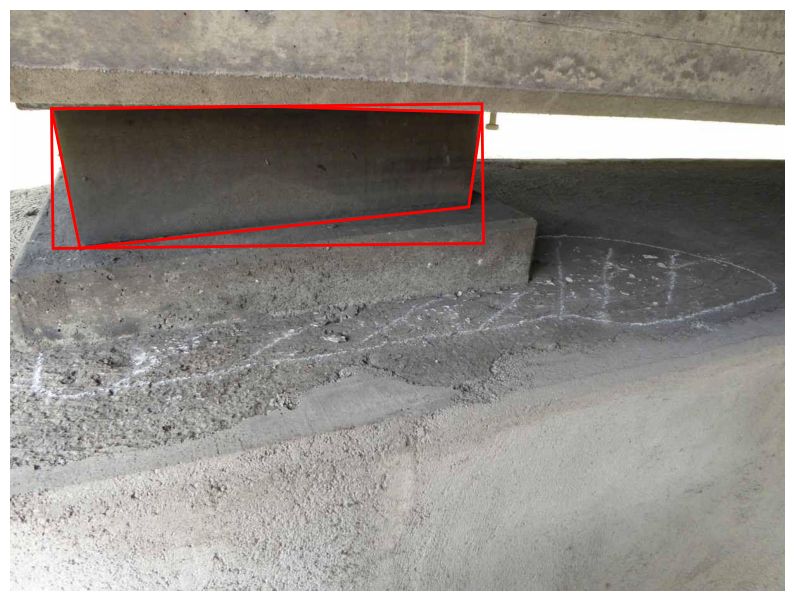

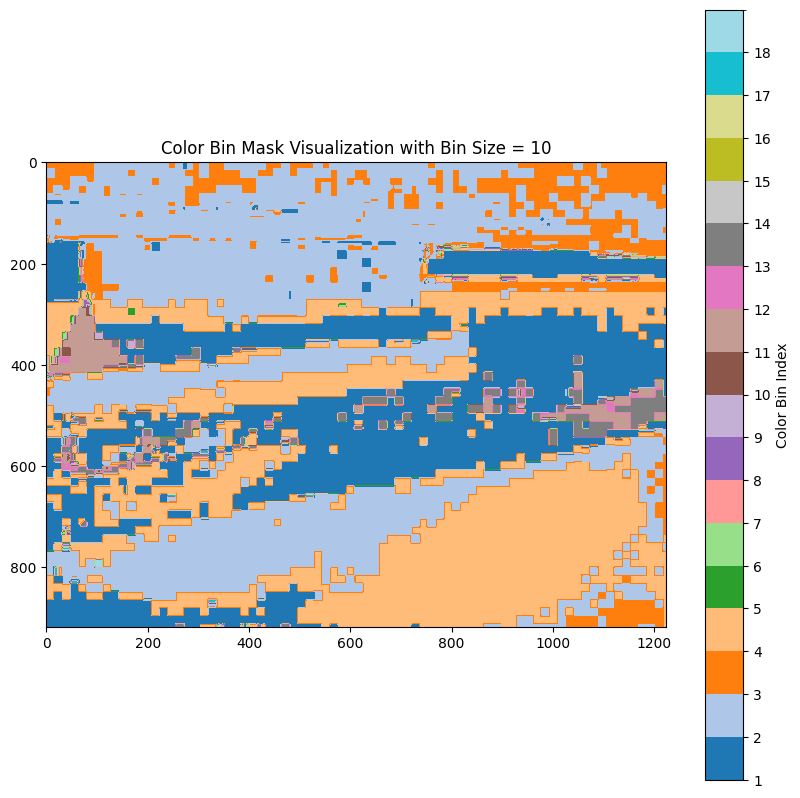

{3: 0.07655891587629537, 2: 0.626885096552734, 1: 0.13392929769477296, 18: 0.00017081781060371894, 4: 0.14541476191250874, 5: 0.0028469635100619823, 6: 0.000634466153670956, 7: 0.0001138785404024793, 12: 0.00028469635100619825, 11: 0.0047340936081602105, 17: 0.00012201272185979925, 8: 0.0005531243390977566, 9: 0.002733084969659503, 10: 0.00017081781060371894, 13: 0.00484797214856269}


IndexError: list index out of range

In [137]:
i = str(1696).zfill(4) # Good images for edge detection: 41, 72, 1524, 851, 45, 1, 458, 689, 1149

# Read in image:
image_path = f"data/dacl10k_v2_devphase/images/train/dacl10k_v2_train_{i}.jpg"
image = cv2.imread(image_path, cv2.IMREAD_COLOR)

# Read in defects:
annotations_path = f"data/dacl10k_v2_devphase/annotations/train/dacl10k_v2_train_{i}.json"
with open(annotations_path, 'r') as file:
    annotations = json.load(file)
defects = annotations['shapes']

# Construct defect polygon:
defect_polygon = np.array(defects[2]['points'], dtype = np.int32)
visualize_image_with_defect(image, defect_polygon)

# Apply functions:

#hough_lines_detector(image)

#metallic_image = metallic_image_filter(image)

#colorful_image = colorful_image_filter(image)

#black_image = black_image_filter(image)
#black_thin_quotient = extract_black_thin_feature(black_image, defect_polygon)

#lbp, rough_image = rough_image_filter(image)
#lbp_value_quotients, texture_entropy = extract_rough_features_1(lbp, defect_polygon)

#elliptic_image_filter(image)

#circles = extract_circles(image)
#circle_existence = extract_circle_feature(image, circles, defect_polygon)
#print(circle_existence)

#convex_shapes_image, _ = convex_shape_image_filter(image)
#in_shape_quotient = extract_in_shape_feature(convex_shapes_image, defect_polygon)
#print(in_shape_quotient)

#convex_shapes_image, hulls = convex_shape_image_filter(image)
#roundness_value = extract_roundness_feature(convex_shapes_image, hulls, defect_polygon)
#print(roundness_value)

color_bins_image = color_bins_image_filter(image)
dominating_color, color_entropy = extract_color_features_1(color_bins_image, defect_polygon)
print(dominating_color, color_entropy)





In [ ]:
print(lbp_value_quotients)
print(texture_entropy)

NameError: name 'lbp_value_quotients' is not defined

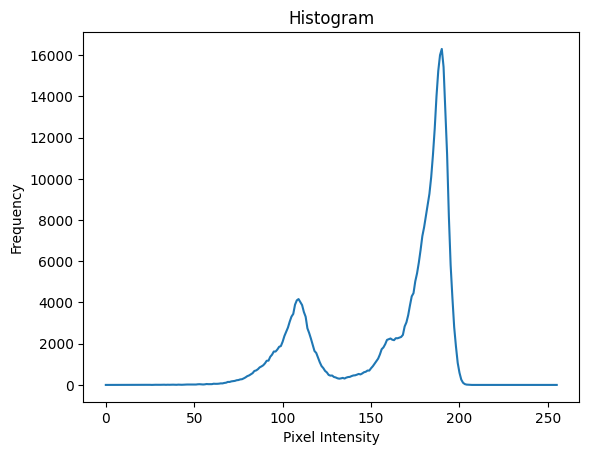

Histogram-based contrast: 2546.585007192401


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def histogram_analysis(image_path, defect_polygon):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    cv2.fillPoly(mask, [defect_polygon], 255)

    hist = cv2.calcHist([image], [0], mask, [256], [0, 256])
    
    plt.plot(hist)
    plt.title("Histogram")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.show()
    
    # Calculate contrast as the spread of the histogram
    pixel_values = np.arange(256)
    mean_intensity = np.mean(image)
    contrast = np.sqrt(np.mean((pixel_values - mean_intensity) ** 2 * hist[:, 0]))
    
    return contrast

i = str(2487).zfill(4)

# Read in image:
image_path = f"data/dacl10k_v2_devphase/images/train/dacl10k_v2_train_{i}.jpg"
image = cv2.imread(image_path, cv2.IMREAD_COLOR)

# Read in defects:
annotations_path = f"data/dacl10k_v2_devphase/annotations/train/dacl10k_v2_train_{i}.json"
with open(annotations_path, 'r') as file:
    annotations = json.load(file)
defects = annotations['shapes']

# Construct defect polygon:
defect_polygon = np.array(defects[0]['points'], dtype = np.int32)

# Example usage
contrast = histogram_analysis(image_path, defect_polygon)
print(f"Histogram-based contrast: {contrast}")


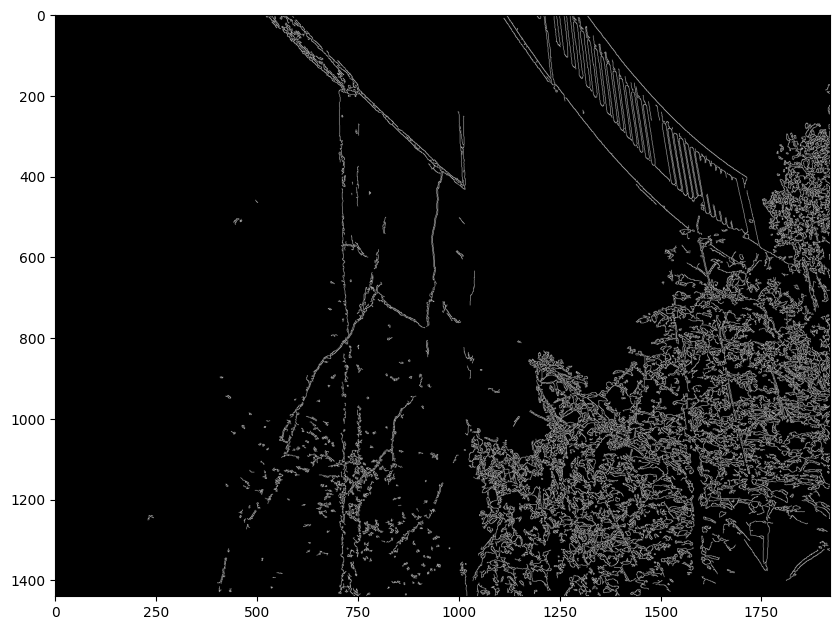

[[255 255 255 ...   0   0   0]
 [255 255 255 ...   0   0   0]
 [255 255 255 ...   0   0   0]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]


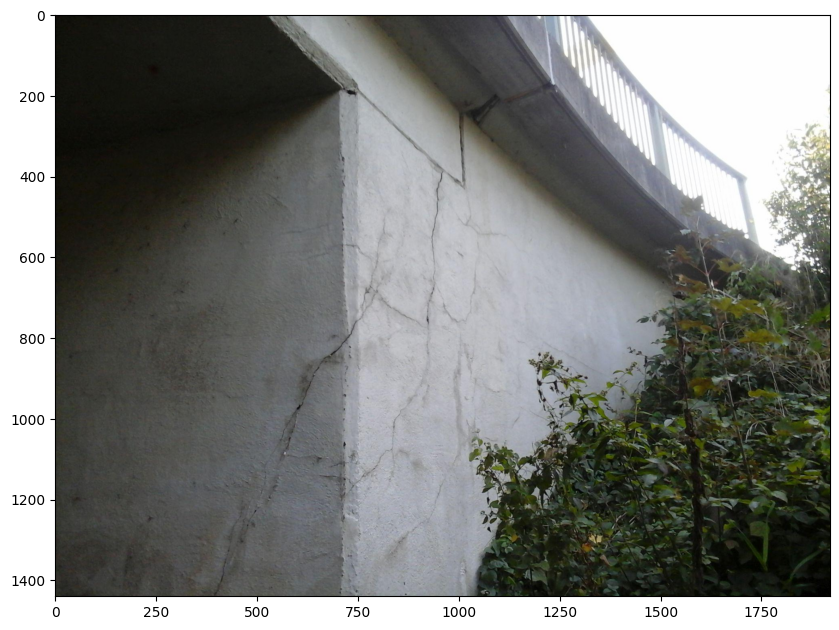

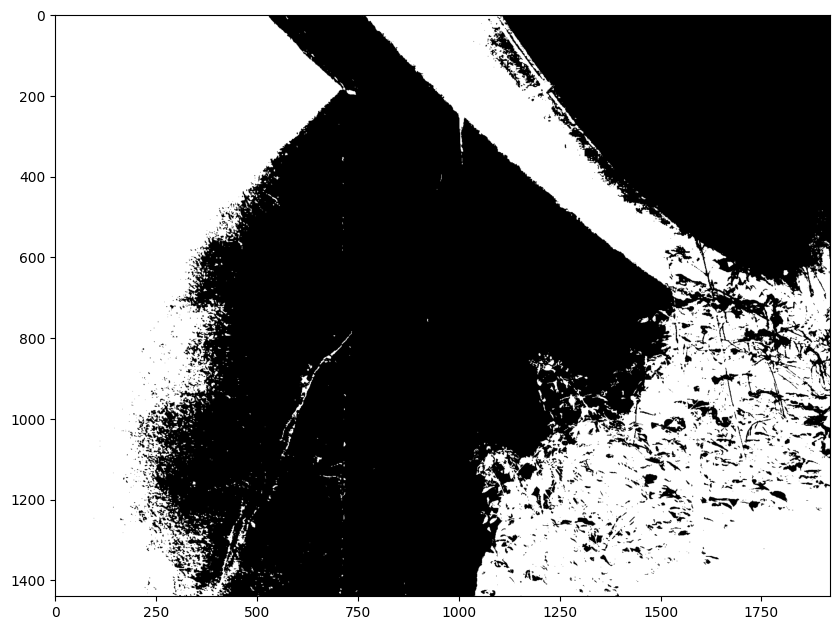

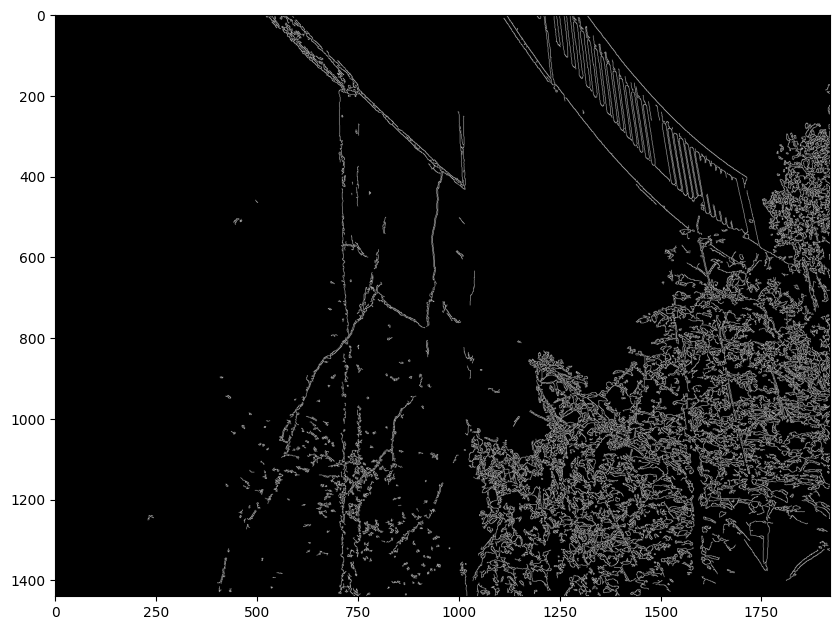

In [ ]:
i = str(2487).zfill(4)

# Read in image:
image_path = f"data/dacl10k_v2_devphase/images/train/dacl10k_v2_train_{i}.jpg"
image = cv2.imread(image_path, cv2.IMREAD_COLOR)

# Read in defects:
annotations_path = f"data/dacl10k_v2_devphase/annotations/train/dacl10k_v2_train_{i}.json"
with open(annotations_path, 'r') as file:
    annotations = json.load(file)
defects = annotations['shapes']

#image = sharpen_image(image)
#image = cv2.GaussianBlur(image, (5, 5), 0)

edges = cv2.Canny(image, 50, 150)
plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(edges, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

black_image = black_image_filter(image)
plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(edges, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg



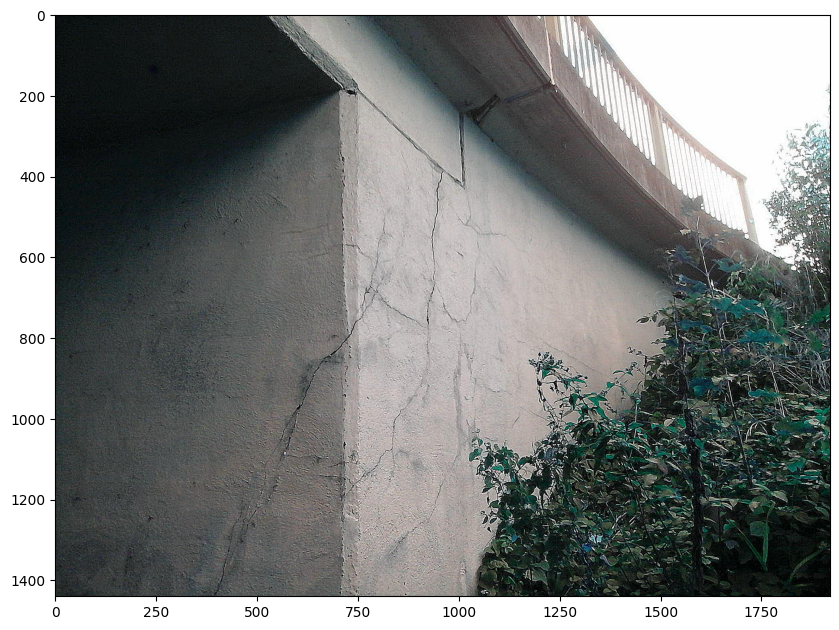

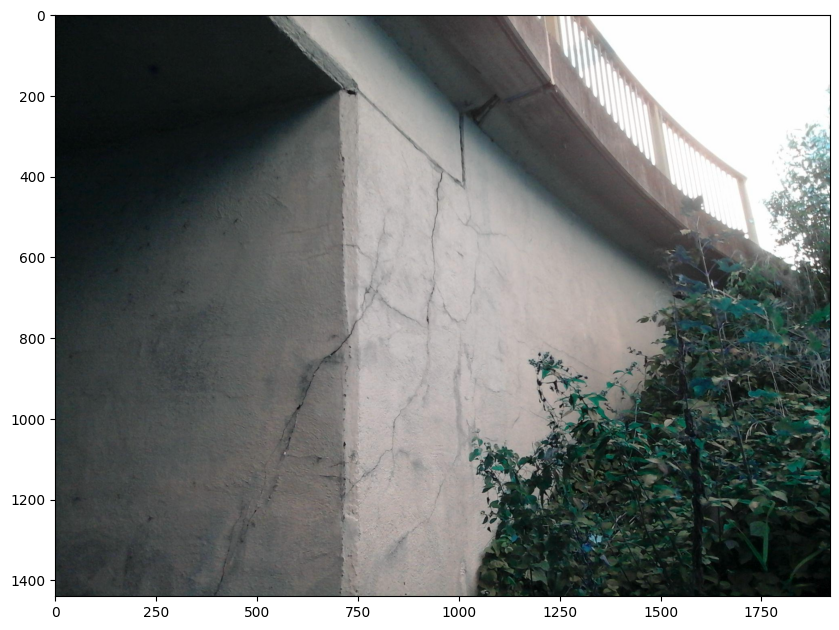

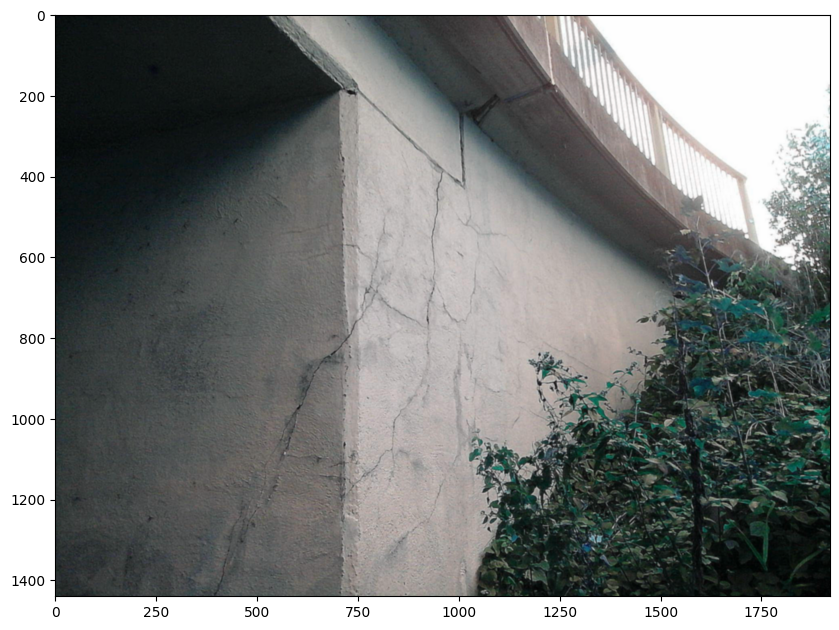

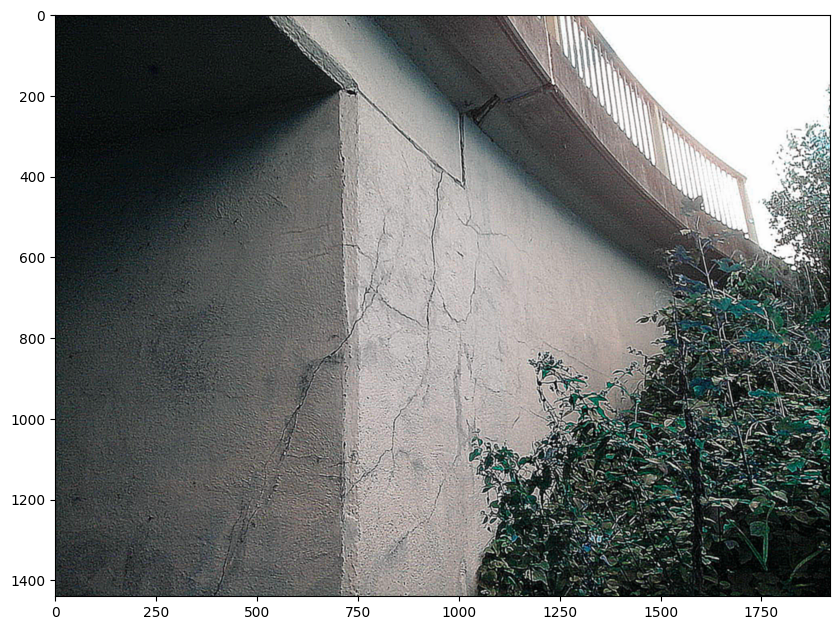

[[255 255 255 ...   0   0   0]
 [255 255 255 ...   0   0   0]
 [255 255 255 ...   0   0   0]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]


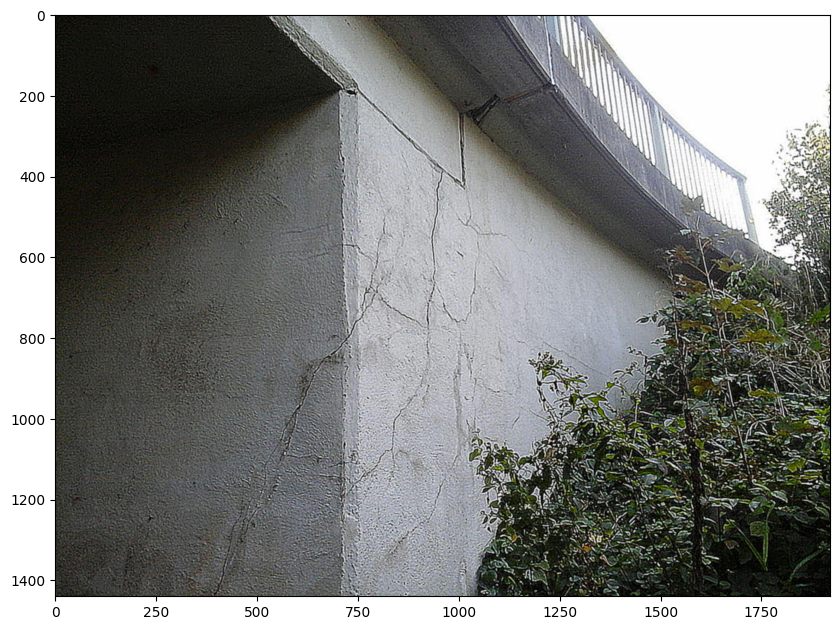

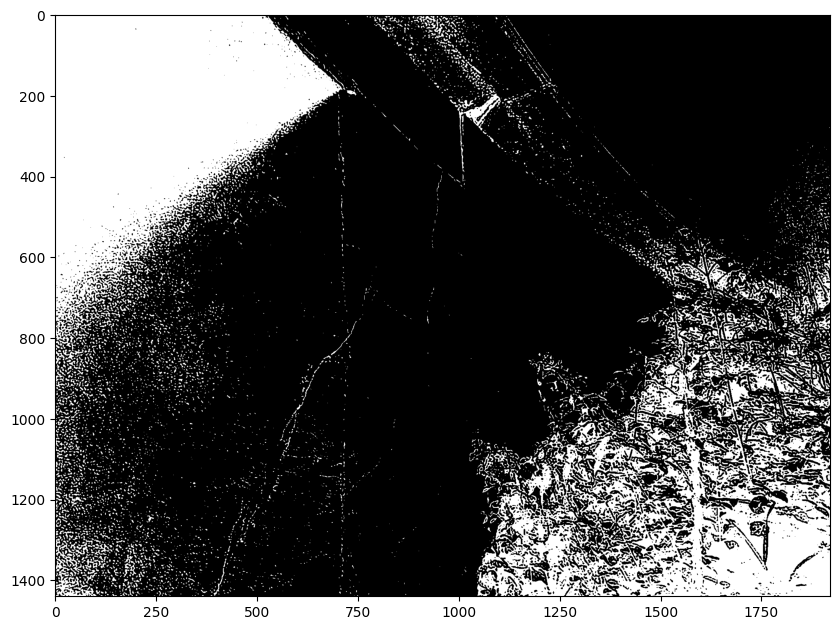

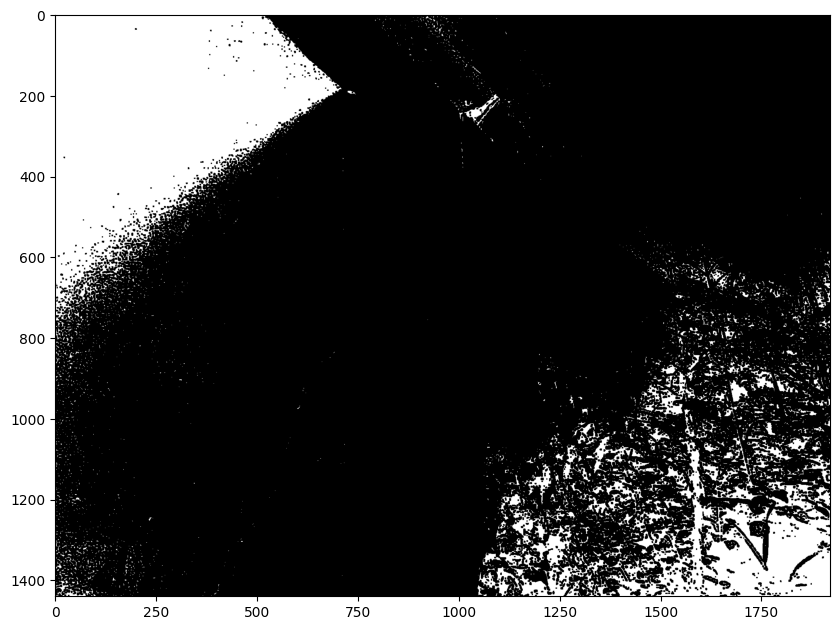

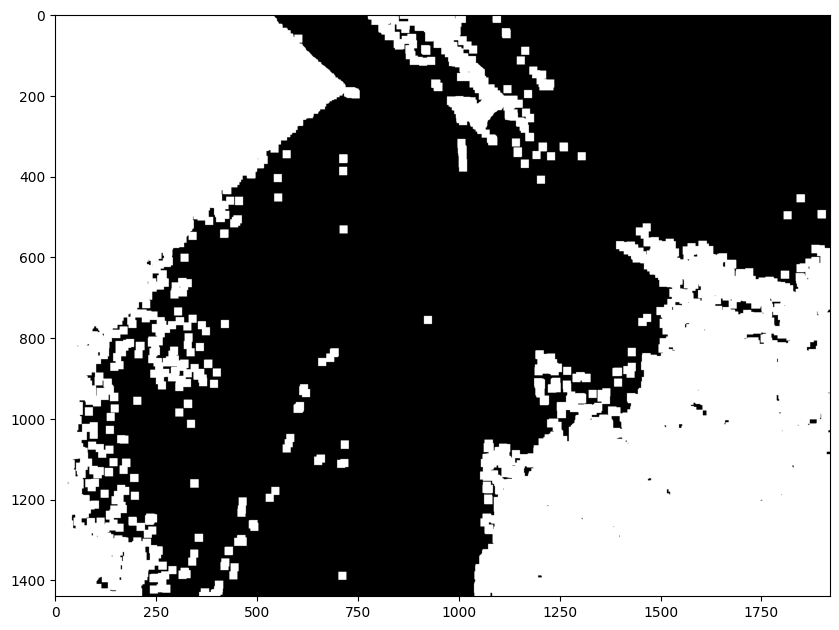

In [ ]:
import cv2
import numpy as np

def sharpen_image(image):

    # Define a sharpening kernel
    sharpening_kernel = np.array([[-1, -1, -1],
                                  [-1,  9, -1],
                                  [-1, -1, -1]])

    # Apply the kernel to the image using cv2.filter2D
    sharpened_image = cv2.filter2D(image, -1, sharpening_kernel)
    
    return sharpened_image

# Example usage
i = str(2487).zfill(4)
image_path = f"data/dacl10k_v2_devphase/images/train/dacl10k_v2_train_{i}.jpg"
image = cv2.imread(image_path)
sharpened_image = sharpen_image(image)


plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(sharpened_image, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(image, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

image = cv2.GaussianBlur(sharpened_image, (7, 7), 0)

plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(image, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

sharpened_image = sharpen_image(image)
image = cv2.GaussianBlur(sharpened_image, (5, 5), 0)
sharpened_image = sharpen_image(image)
image = cv2.GaussianBlur(sharpened_image, (5, 5), 0)
sharpened_image = sharpen_image(image)

plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(image, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

black_image = black_image_filter(image)

kernel = np.ones((3, 3), np.uint8)
black_image = cv2.erode(black_image, kernel, iterations=1)

plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(cv2.cvtColor(black_image, cv2.COLOR_BGR2RGB), cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

kernel = np.ones((20, 20), np.uint8)
black_image = cv2.dilate(black_image, kernel, iterations=1)


# edges = cv2.Canny(sharpened_image, 600, 800)

plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(cv2.cvtColor(black_image, cv2.COLOR_BGR2RGB), cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg


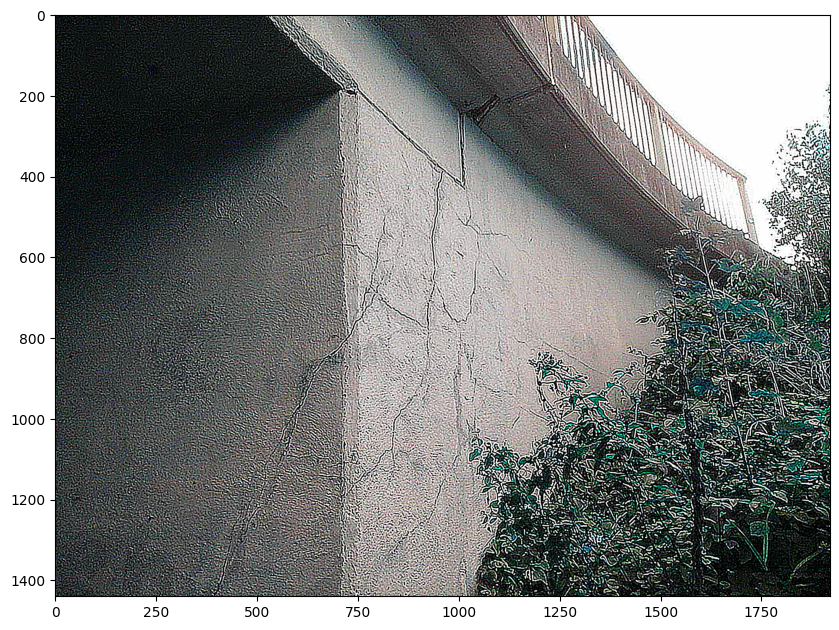

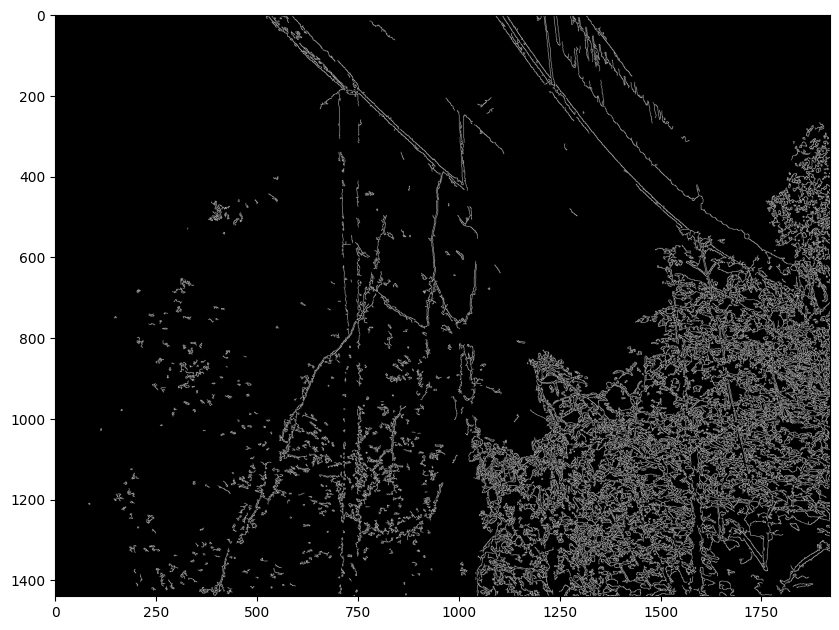

In [ ]:
import cv2

def equalize_histogram_color(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to YUV color space
    yuv_image = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
    
    # Apply histogram equalization to the Y channel
    yuv_image[:, :, 0] = cv2.equalizeHist(yuv_image[:, :, 0])
    
    # Convert the image back to BGR color space
    equalized_image = cv2.cvtColor(yuv_image, cv2.COLOR_YUV2BGR)
    
    return equalized_image

# Example usage
i = str(2487).zfill(4)
image_path = f"data/dacl10k_v2_devphase/images/train/dacl10k_v2_train_{i}.jpg"
equalized_image = equalize_histogram_color(image_path)

# Display the original and equalized images
plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(sharpened_image, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

edges = cv2.Canny(equalized_image, 50, 150)
    
plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(edges, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

black_image = black_image_filter(equalized_image)



**Function to find images with a specified defect type**

In [272]:
def get_images_with_defect(defect_type):
    image_numbers = []
    for i in range(500):
        i = str(i).zfill(4)

        # Read in annotations:
        annotations_path = f"data/dacl10k_v2_devphase/annotations/train/dacl10k_v2_train_{i}.json"
        with open(annotations_path, 'r') as file:
            annotations = json.load(file)
        defects = annotations['shapes']
        labels = []
        for k in range(len(defects)):
            labels.append(defects[k]['label'])
        if defect_type in labels:
            image_numbers.append(i)
    return np.array(image_numbers)

defect_type = "Drainage"
image_numbers = get_images_with_defect(defect_type)
print(image_numbers)

['0001' '0008' '0024' '0029' '0041' '0047' '0048' '0050' '0071' '0072'
 '0076' '0082' '0091' '0092' '0102' '0106' '0107' '0110' '0115' '0143'
 '0144' '0154' '0157' '0165' '0170' '0175' '0176' '0183' '0189' '0193'
 '0204' '0208' '0211' '0215' '0218' '0220' '0228' '0235' '0241' '0242'
 '0247' '0248' '0255' '0256' '0257' '0264' '0266' '0289' '0314' '0315'
 '0316' '0317' '0318' '0331' '0332' '0341' '0345' '0355' '0371' '0377'
 '0379' '0383' '0387' '0402' '0404' '0421' '0422' '0424' '0425' '0428'
 '0429' '0430' '0438' '0451' '0455' '0456' '0460' '0468' '0472' '0476'
 '0488' '0492' '0498']
